# MNIST Model 1 with Context

In [1]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

import pandas as pd
from tensorflow.keras.datasets import mnist

# Setting Things Up

In [2]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]

         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample
            nn.GroupNorm(8, 2 * n_feat), # normalize
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]

        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)

        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)

        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


In [3]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
#device = torch.device('cpu')
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 10 # context vector is of size 10
height = 28 # 28x28 image
save_dir = './weights/'

# training hyperparameters
batch_size = 100
n_epoch = 32
lrate=1e-3

In [4]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()
ab_t[0] = 1

In [5]:
# construct model
#nn_model = ContextUnet(in_channels=1, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

# Creating Input and Label files

In [6]:
# Load the MNIST dataset
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

# Select a portion of the dataset
#num_samples = 11000
#train_images = train_images[:num_samples]
#train_labels = train_labels[:num_samples]
#test_images = test_images[:num_samples]
#test_labels = test_labels[:num_samples]

# Combine the Train and Test Set to train on all the data
train_images = np.concatenate((train_images, test_images), axis=0)
train_labels = np.concatenate((train_labels, test_labels), axis=0)

# Convert labels to one-hot encoded format using Pandas
num_classes = 10  # Number of classes (digits 0-9)

# Convert training labels to one-hot encoded DataFrame
one_hot_train_labels = pd.get_dummies(train_labels)
one_hot_train_labels.columns = [f'label_{i}' for i in range(num_classes)]  # Rename columns for clarity

In [7]:
np.save('train_images.npy', train_images)
np.save('one_hot_train_labels.npy', one_hot_train_labels.to_numpy())

# Training with Context

In [8]:
# construct/reset neural network
nn_model = ContextUnet(in_channels=1, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

# load dataset
dataset = CustomDataset("train_images.npy", "one_hot_train_labels.npy", transform, null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)

# re setup optimizer
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (70000, 28, 28)
labels shape: (70000, 10)


In [ ]:
# helper function: perturbs an image to a specified noise level
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

##### The below cell is optional, only run it if you want to retrain the model. Otherwise the weights from the previous training session will be loaded in.

In [ ]:
# training with context code
# set into train mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep}')

    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)

    pbar = tqdm(dataloader, mininterval=2 )
    for x, c in pbar:   # x: images  c: context
        optim.zero_grad()
        x = x.to(device)
        c = c.to(x)

        # randomly mask out c
        context_mask = torch.bernoulli(torch.zeros(c.shape[0]) + 0.9).to(device)
        c = c * context_mask.unsqueeze(-1)

        # perturb data
        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device)
        x_pert = perturb_input(x, t, noise)

        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps, c=c)

        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()

        optim.step()

    # save model periodically
    if ep%4==0 or ep == int(n_epoch-1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"context_model_{ep}.pth")
        print('saved model at ' + save_dir + f"context_model_{ep}.pth")

epoch 0


100%|██████████| 700/700 [01:02<00:00, 11.24it/s]


saved model at ./weights/context_model_0.pth
epoch 1


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 2


100%|██████████| 700/700 [01:04<00:00, 10.91it/s]


epoch 3


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 4


100%|██████████| 700/700 [01:04<00:00, 10.92it/s]


saved model at ./weights/context_model_4.pth
epoch 5


100%|██████████| 700/700 [01:04<00:00, 10.91it/s]


epoch 6


100%|██████████| 700/700 [01:04<00:00, 10.91it/s]


epoch 7


100%|██████████| 700/700 [01:04<00:00, 10.91it/s]


epoch 8


100%|██████████| 700/700 [01:04<00:00, 10.90it/s]


saved model at ./weights/context_model_8.pth
epoch 9


100%|██████████| 700/700 [01:04<00:00, 10.92it/s]


epoch 10


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 11


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 12


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


saved model at ./weights/context_model_12.pth
epoch 13


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 14


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 15


100%|██████████| 700/700 [01:04<00:00, 10.94it/s]


epoch 16


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


saved model at ./weights/context_model_16.pth
epoch 17


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 18


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 19


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 20


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


saved model at ./weights/context_model_20.pth
epoch 21


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 22


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 23


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 24


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


saved model at ./weights/context_model_24.pth
epoch 25


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 26


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 27


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 28


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


saved model at ./weights/context_model_28.pth
epoch 29


100%|██████████| 700/700 [01:04<00:00, 10.93it/s]


epoch 30


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]


epoch 31


100%|██████████| 700/700 [01:03<00:00, 10.94it/s]

saved model at ./weights/context_model_31.pth


In [10]:
# load in pretrain model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/context_model_31.pth", map_location=device))
nn_model.eval()
print("Loaded in Context Model")

Loaded in Context Model


# DDPM Sampling with Random Context

In [11]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [12]:
# sample with context using standard algorithm
@torch.no_grad()
def sample_ddpm_context(n_sample, context, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 1, height, height).to(device)

    # array to keep track of generated steps for plotting
    intermediate = []
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t, c=context)    # predict noise e_(x_t,t, ctx)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [13]:
# visualize samples with randomly selected context
plt.clf()
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device).float()
samples, intermediate = sample_ddpm_context(16, ctx)
animation_ddpm_context = plot_sample(intermediate,16,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>

In [14]:
# Save the animation as a video file
#video_path = 'MNIST_samples_animation.mp4'
#animation_ddpm_context.save(video_path, fps=30, extra_args=['-vcodec', 'libx264'])

# User Defined Context

In [15]:
def show_images(imgs, nrow=2):
    _, axs = plt.subplots(nrow, imgs.shape[0] // nrow, figsize=(4,2 ))
    axs = axs.flatten()
    for img, ax in zip(imgs, axs):
        img = (img.permute(1, 2, 0).clip(-1, 1).detach().cpu().numpy() + 1) / 2
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img)
    plt.show()

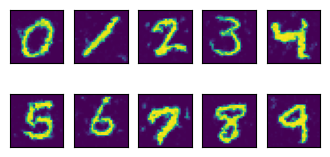

In [16]:
# user defined context
ctx = torch.tensor([
    # 0,2,3,4,5,6,7,8,9
    [1,0,0,0,0,0,0,0,0,0], # 1
    [0,1,0,0,0,0,0,0,0,0], # 2
    [0,0,1,0,0,0,0,0,0,0],
    [0,0,0,1,0,0,0,0,0,0],
    [0,0,0,0,1,0,0,0,0,0],
    [0,0,0,0,0,1,0,0,0,0],
    [0,0,0,0,0,0,1,0,0,0],
    [0,0,0,0,0,0,0,1,0,0],
    [0,0,0,0,0,0,0,0,1,0],
    [0,0,0,0,0,0,0,0,0,1], # 9
]).float().to(device)
samples, _ = sample_ddpm_context(ctx.shape[0], ctx)
show_images(samples)

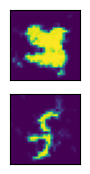

In [17]:
# mix of defined context
ctx = torch.tensor([
    #[1,1,0,0,0,0,0,0,0,0], #0,1
    [0,0,0,0,0,1,0,1,0,0], #5,7
    #[0,0,0,1,0,0,1,0,0,0], #3,6
    [0,0,0,0,0,1,0,0.5,0,0] #5,7 with less emphasis on 7
]).float().to(device)
samples, _ = sample_ddpm_context(ctx.shape[0], ctx)
show_images(samples)

# DDIM Sampling with Random Context

In [18]:
# define sampling function for DDIM   
# removes the noise using ddim
def denoise_ddim(x, t, t_prev, pred_noise):
    ab = ab_t[t]
    ab_prev = ab_t[t_prev]
    
    x0_pred = ab_prev.sqrt() / ab.sqrt() * (x - (1 - ab).sqrt() * pred_noise)
    dir_xt = (1 - ab_prev).sqrt() * pred_noise

    return x0_pred + dir_xt

In [19]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/context_model_31.pth", map_location=device))
nn_model.eval() 
print("Loaded in Context Model")

Loaded in Context Model


In [20]:
# fast sampling algorithm with context
@torch.no_grad()
def sample_ddim_context(n_sample, context, n=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, 1, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    step_size = timesteps // n
    for i in range(timesteps, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        eps = nn_model(samples, t, c=context)    # predict noise e_(x_t,t)
        samples = denoise_ddim(samples, i, i - step_size, eps)
        intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [21]:
# visualize samples
plt.clf()
ctx = F.one_hot(torch.randint(0, 5, (32,)), 5).to(device=device).float()
samples, intermediate = sample_ddim_context(16, ctx)
animation_ddpm_context = plot_sample(intermediate,16,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm_context.to_jshtml())

<Figure size 640x480 with 0 Axes>

# Compare DDPM, DDIM speed

In [22]:
%timeit -r 1 sample_ddim_context(16, ctx)
%timeit -r 1 sample_ddpm_context(16, ctx)

175 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
3.94 s ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)
